#### The following code fine-tunes a Faster R-CNN model variant using a ResNet50 backbone with Feature Pyramid Network (FPN) for multi-scale feature extraction. It is specifically tailored to classify five different flight classes.

Faster R-CNN is an object detection model that consists of two main components: a backbone network for feature extraction and a region proposal network (RPN) for generating candidate object bounding boxes. In this variant, ResNet50 serves as the backbone network, providing robust feature representations, while FPN enhances the model's ability to detect objects at different scales.

The model is fine-tuned to classify five flight classes, namely 737, 747, 767, A380, and CRJ. These classes are commonly used to categorize different types of aircraft.

Here's an overview of the fine-tuning process:
1. Load a pre-trained Faster R-CNN model with a ResNet50 backbone.
2. Adjust the classification head of the model to output predictions for the five flight classes.
3. Fine-tune the model using labeled data containing images of aircraft from the five classes.
4. Evaluate the fine-tuned model to ensure it performs well on the task of classifying aircraft.


In [35]:
import numpy as np
import os
import random
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import torchvision
import torch
from torchvision import transforms as T
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import IPython.display as display

from PIL import Image, ImageDraw
import pandas as pd
import torch
import cv2
import torchvision.transforms as transforms
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from collections import Counter
from google.colab import drive

In [36]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn()

In [37]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [38]:
cd /content/drive/MyDrive/fgvc-aircraft-2013b/fgvc-aircraft-2013b/

/content/drive/MyDrive/fgvc-aircraft-2013b/fgvc-aircraft-2013b


In [ ]:
# cat data/images_box.txt

In [7]:

data = pd.read_csv('flight_filtered.csv')

In [9]:
data.head()

,Unnamed: 0,imageid,xmin,ymin,xmax,ymax,Classes,Labels,Family,Target
0,0,1152739.jpg,65,125,1152,560,737-200,2,737,0
1,1,1187709.jpg,10,186,1017,534,737-200,2,737,0
2,2,1548405.jpg,14,178,1488,720,737-200,2,737,0
3,3,1094669.jpg,118,157,1015,478,737-200,2,737,0
4,4,1189268.jpg,39,173,996,515,737-200,2,737,0


image shape (1200, 812)


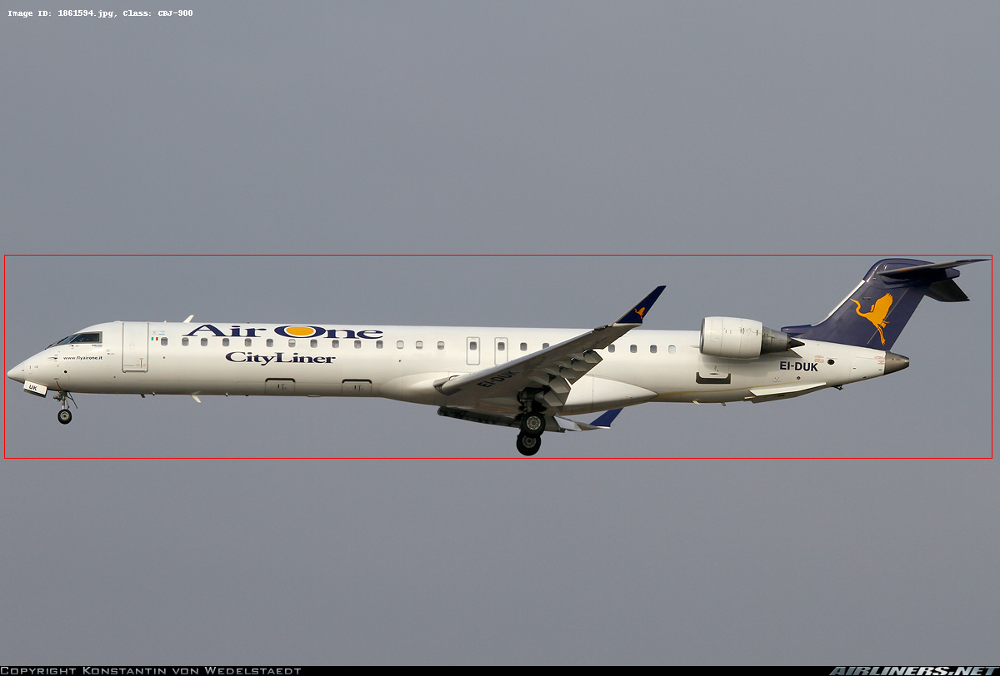

image shape (1280, 882)


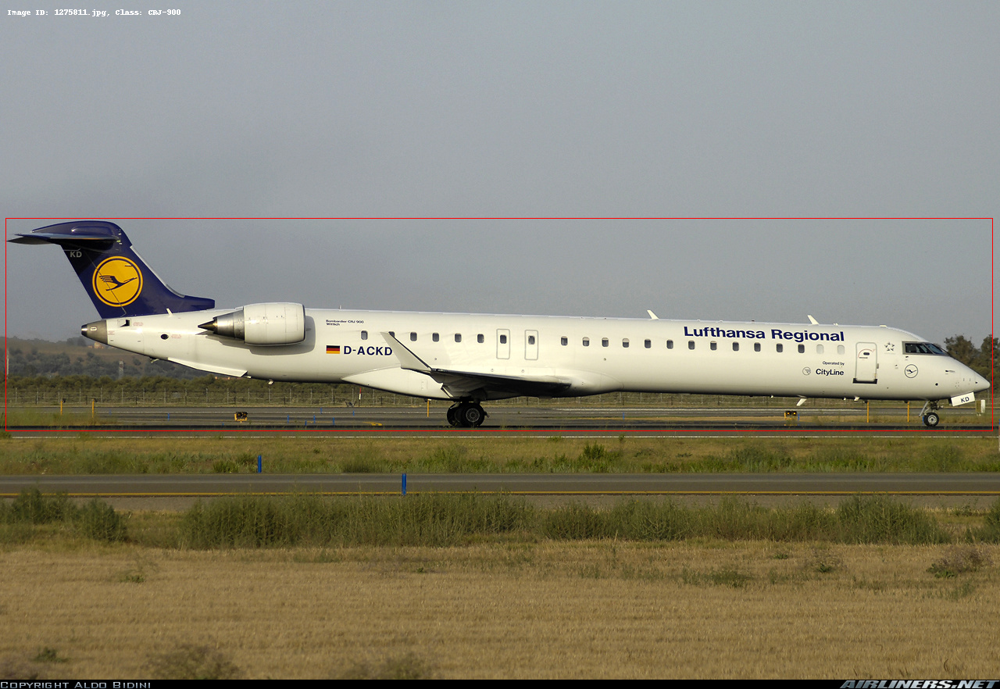

image shape (1024, 695)


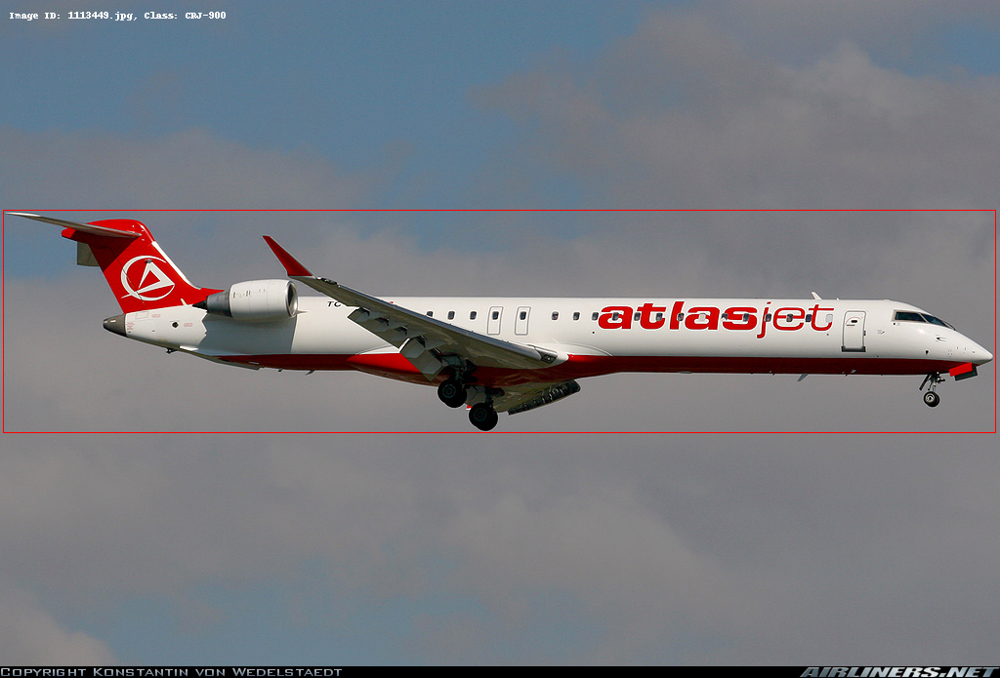

image shape (1024, 705)


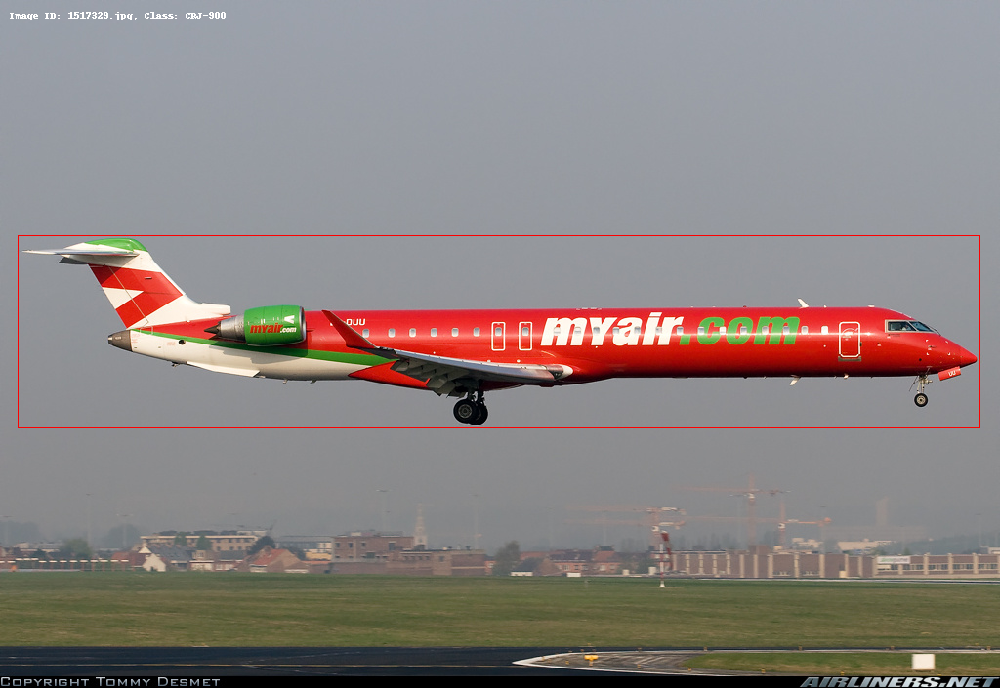

image shape (1200, 812)


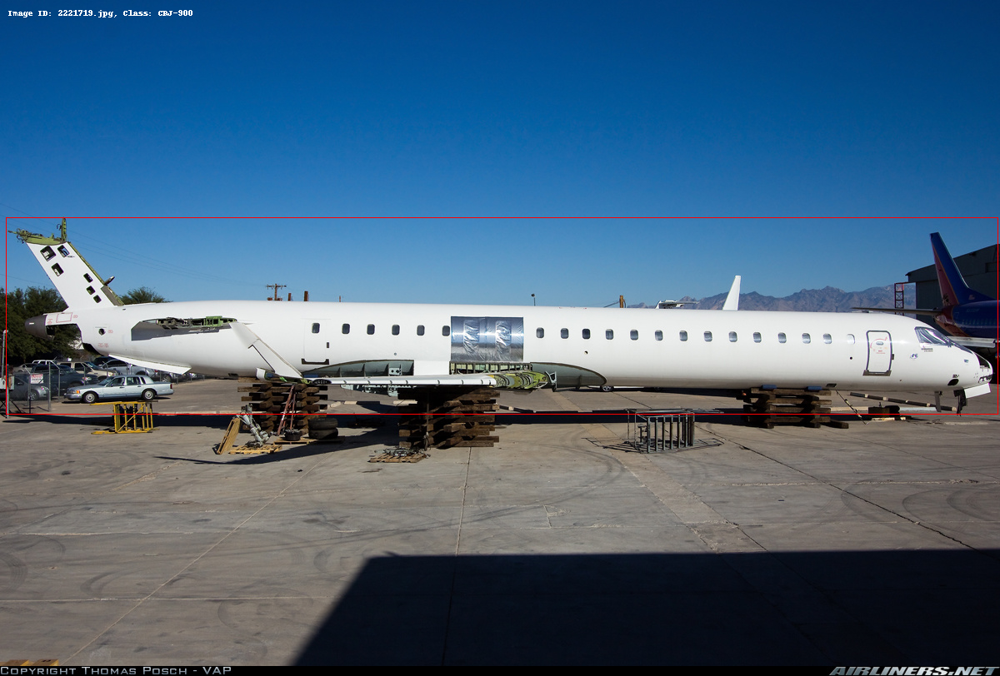

image shape (1024, 695)


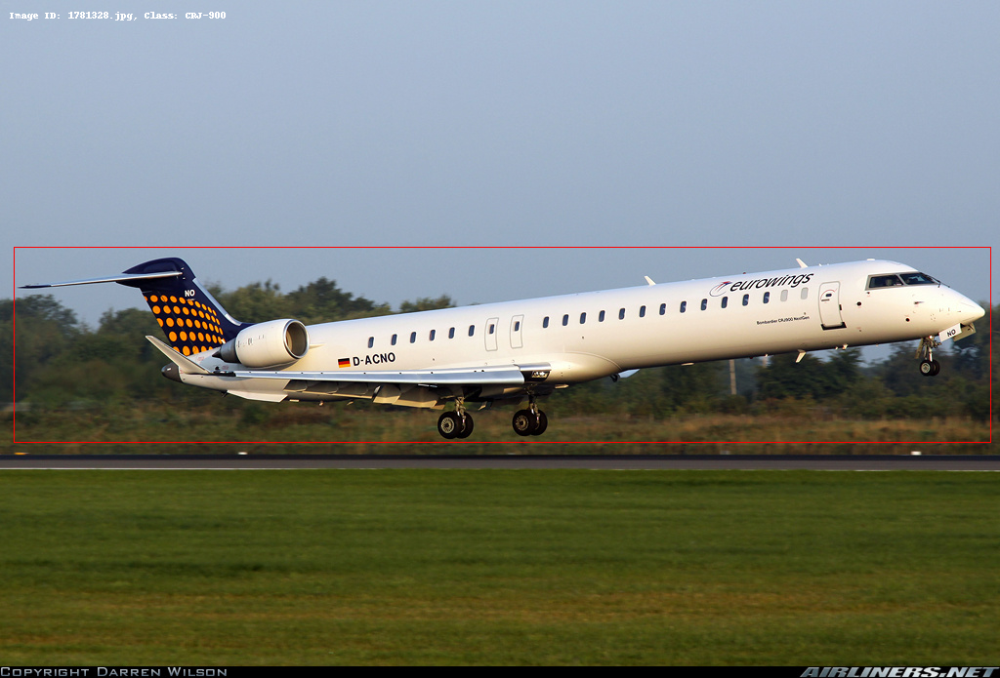

image shape (1200, 812)


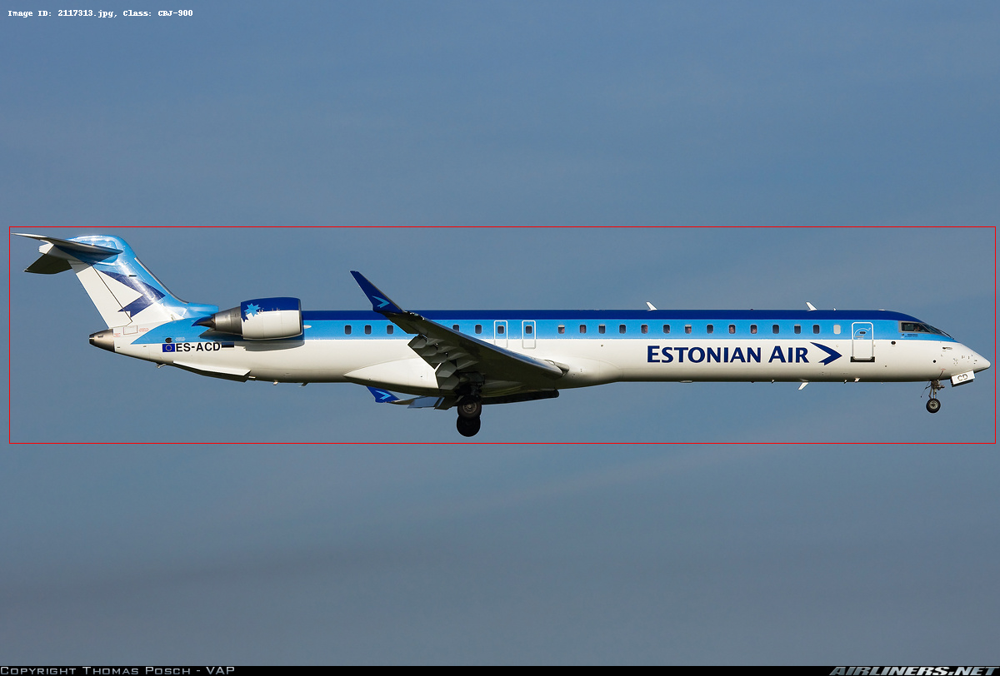

image shape (1600, 1079)


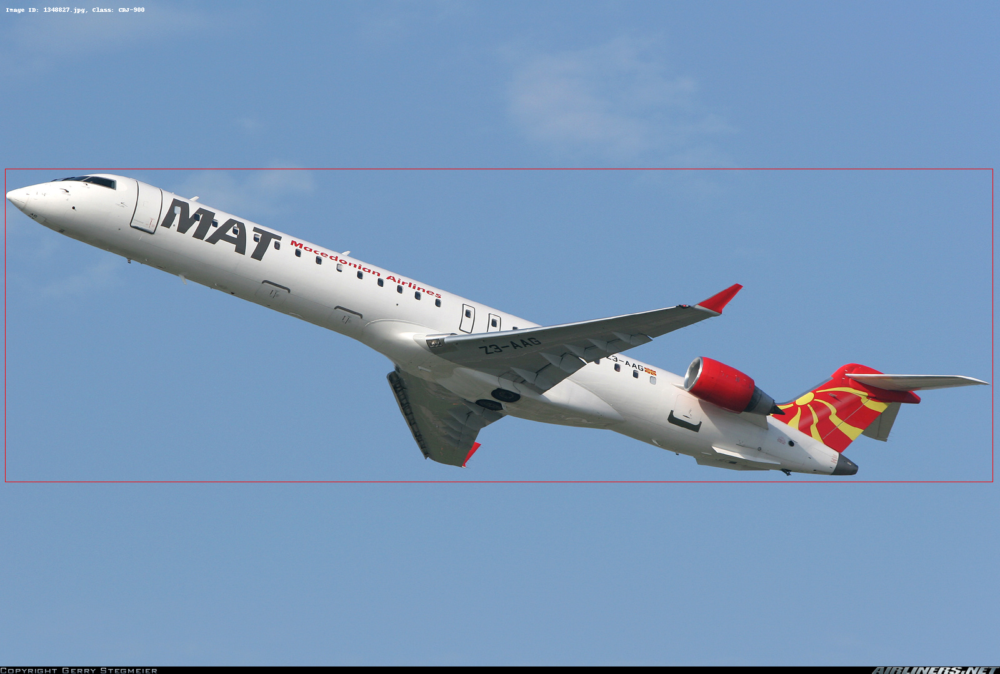

image shape (1200, 812)


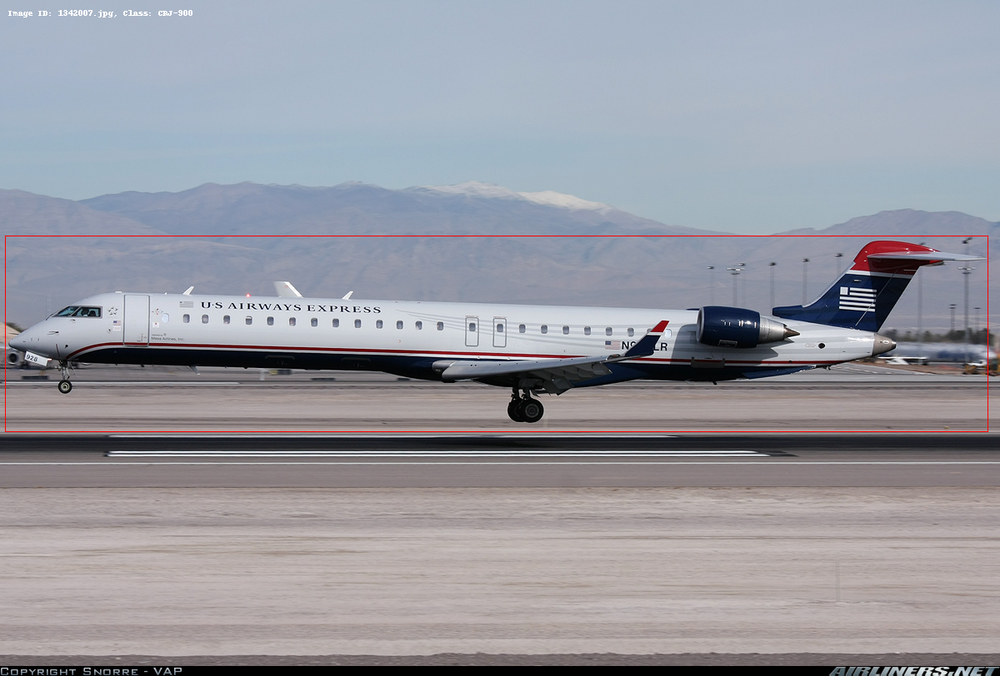

image shape (1200, 826)


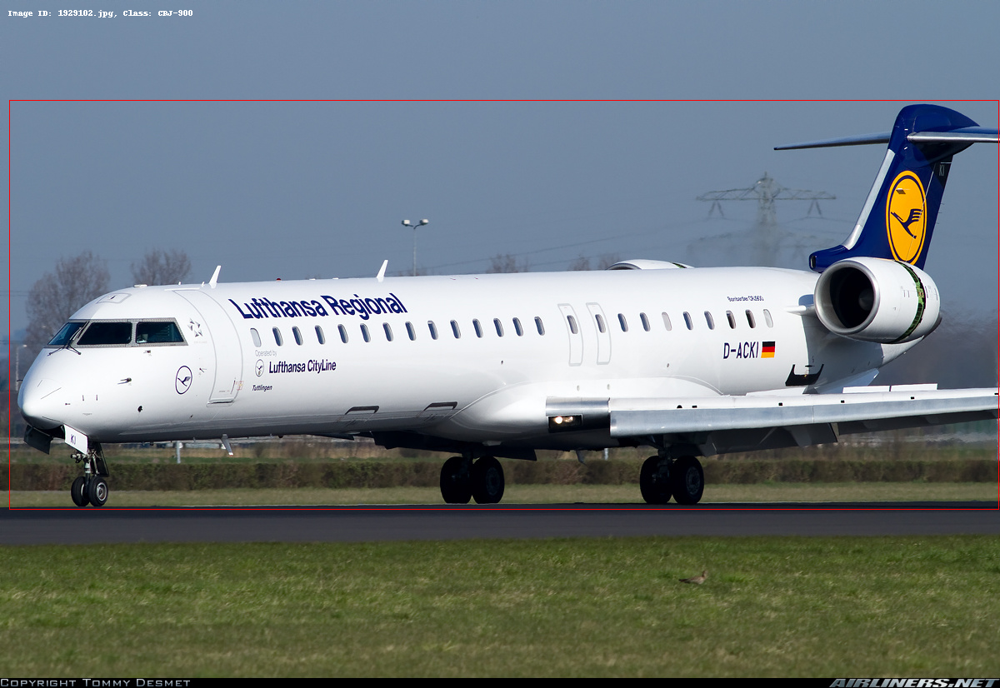

In [ ]:
from PIL import Image, ImageDraw
import pandas as pd
import IPython.display as display


df = flight_filtered.tail(10)

path_image='data/images/'

# Function to draw bounding boxes on images and add title
def draw_boxes(image_path, boxes, title):
    image = Image.open(image_path)
    print(f"image shape {image.size}")
    draw = ImageDraw.Draw(image)
    for box in boxes:
        xmin, ymin, xmax, ymax = box
        draw.rectangle([xmin, ymin, xmax, ymax], outline="red")
    draw.text((10, 10), title, fill="white")  # Add title at position (10, 10)
    return image

# Iterate over each row in the DataFrame and draw bounding boxes on the corresponding images
for index, row in df.iterrows():
    image_path = path_image + row['imageid']  # Update this path with the location of your images
    boxes = [(row['xmin'], row['ymin'], row['xmax'], row['ymax'])]
    title = f"Image ID: {row['imageid']}, Class: {row['Classes']}"  # Title for the image
    result_image = draw_boxes(image_path, boxes, title)
    display.display(result_image)  # Display the image with bounding box and title


In [9]:
df = data

family_mapping = {'737': 1, '747': 2, '767': 3, 'A380': 4, 'CRJ': 5}


# Apply the mapping to the 'Family' column
df['Target'] = df['Family'].map(family_mapping)

In [10]:
df.head()

,Unnamed: 0,imageid,xmin,ymin,xmax,ymax,Classes,Labels,Family,Target
0,0,1152739.jpg,65,125,1152,560,737-200,2,737,1
1,1,1187709.jpg,10,186,1017,534,737-200,2,737,1
2,2,1548405.jpg,14,178,1488,720,737-200,2,737,1
3,3,1094669.jpg,118,157,1015,478,737-200,2,737,1
4,4,1189268.jpg,39,173,996,515,737-200,2,737,1


from matplotlib import pyplot as plt
_df_0['Unnamed: 0'].plot(kind='hist', bins=20, title='Unnamed: 0')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['xmin'].plot(kind='hist', bins=20, title='xmin')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['ymin'].plot(kind='hist', bins=20, title='ymin')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['xmax'].plot(kind='hist', bins=20, title='xmax')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_4.groupby('imageid').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='Unnamed: 0', y='xmin', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='xmin', y='ymin', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7.plot(kind='scatter', x='ymin', y='xmax', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_8.plot(kind='scatter', x='xmax', y='ymax', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Unnamed: 0']
  ys = series['xmin']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_9.sort_values('Unnamed: 0', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('imageid')):
  _plot_series(series, series_name, i)
  fig.legend(title='imageid', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Unnamed: 0')
_ = plt.ylabel('xmin')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Unnamed: 0']
  ys = series['ymin']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_10.sort_values('Unnamed: 0', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('imageid')):
  _plot_series(series, series_name, i)
  fig.legend(title='imageid', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Unnamed: 0')
_ = plt.ylabel('ymin')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Unnamed: 0']
  ys = series['xmax']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_11.sort_values('Unnamed: 0', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('imageid')):
  _plot_series(series, series_name, i)
  fig.legend(title='imageid', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Unnamed: 0')
_ = plt.ylabel('xmax')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Unnamed: 0']
  ys = series['ymax']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_12.sort_values('Unnamed: 0', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('imageid')):
  _plot_series(series, series_name, i)
  fig.legend(title='imageid', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Unnamed: 0')
_ = plt.ylabel('ymax')

from matplotlib import pyplot as plt
_df_13['Unnamed: 0'].plot(kind='line', figsize=(8, 4), title='Unnamed: 0')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_14['xmin'].plot(kind='line', figsize=(8, 4), title='xmin')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_15['ymin'].plot(kind='line', figsize=(8, 4), title='ymin')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_16['xmax'].plot(kind='line', figsize=(8, 4), title='xmax')
plt.gca().spines[['top', 'right']].set_visible(False)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_17['imageid'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_17, x='Unnamed: 0', y='imageid', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_18['imageid'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_18, x='xmin', y='imageid', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_19['imageid'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_19, x='ymin', y='imageid', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_20['imageid'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_20, x='xmax', y='imageid', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [40]:
class CustDat(torch.utils.data.Dataset):
  def __init__(self,df,unique_imgs,indices):
    self.df=df
    self.unique_imgs=unique_imgs
    self.indices=indices
  def __len__(self):
    return len(self.indices)
  def __getitem__(self,idx):
    image_name=self.unique_imgs[self.indices[idx]]

    boxes=self.df[self.df.imageid==image_name].values[: , 2:6].astype("float")
    # img=Image.open("../input/global-wheat-detection/train/" + image_name + ".jpg").convert('RGB')
    img=Image.open('data/images/' + image_name).convert('RGB')
    labels=torch.tensor(self.df[self.df.imageid == image_name]['Target'].values, dtype=torch.int64)
    # labels=torch.ones((boxes.shape[0]) , dtype = torch.int64)
    target = {}
    target["boxes"] = torch.tensor(boxes)
    target["label"] = labels
    return T.ToTensor()(img) , target


In [29]:
unique_imgs=df.imageid.unique()

In [ ]:
train_inds('')

In [30]:
train_inds , val_inds = train_test_split(range(unique_imgs.shape[0]) , test_size = 0.1)

In [ ]:
train_dl

In [41]:
def custom_collate(data):
  return data

In [42]:
train_dl = torch.utils.data.DataLoader(CustDat(df , unique_imgs , train_inds) ,
                                       batch_size = 5 ,
                                       shuffle = True ,
                                       collate_fn = custom_collate ,
                                       pin_memory = True if torch.cuda.is_available() else False)

val_d1 = torch.utils.data.DataLoader(CustDat(df , unique_imgs , val_inds) ,
                                     batch_size = 4 ,
                                     shuffle = True ,
                                     collate_fn = custom_collate ,
                                     pin_memory = True if torch.cuda.is_available() else False)

In [43]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained = True)
num_classes = 6
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [39]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [40]:
device

device(type='cpu')

In [44]:
optimizer=torch.optim.SGD(model.parameters(),lr=0.001,momentum=0.9,weight_decay=0.0005)
num_epochs=20

####  Model training on GPU

In [47]:
model.to(device)
for epochs in range(num_epochs):
  epoch_loss=0
  for data in train_dl:
    imgs=[]
    targets=[]
    for d in data:
      imgs.append(d[0].to(device))
      targ={}
      targ["boxes"]=d[1]["boxes"].to(device)
      targ["labels"]=d[1]["label"].to(device)
      targets.append(targ)
    loss_dict=model(imgs,targets)
    loss=sum(v for v in loss_dict.values())
    epoch_loss+=loss.cpu().detach().numpy()
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
  print(epoch_loss)



17.892050769405245
12.404148218487395
12.275645255875219
9.89606542107558
7.816686890436176
6.998103626278741
7.020574651608079
6.802366331328541
6.162932589950113
5.783697485633016
5.581599129832312
5.223331834956292
5.153887257432038
5.013045197058643
4.653165637052858
4.866864537632204
4.607377721468789
4.418404192232925
4.210848842015679
4.2693154248402


#### Saving the model for inference

In [42]:
filename = 'transferlearningnew.pt'



In [54]:
torch.save(model, filename)

# Load the model for inference
loaded_model = torch.load(filename)
loaded_model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [49]:
ls

data/         example_evaluation.m  README.html  train.csv            vl_argparse.m  vl_roc.m
evaluation.m  flight_filtered.csv   README.md    transferlearning.pt  vl_pr.m        vl_tpfp.m


In [50]:
model.eval()
data=iter(val_d1).__next__()

In [51]:
data

[[tensor([[[0.8196, 0.8196, 0.8196,  ..., 0.7804, 0.7804, 0.7765],
           [0.8196, 0.8196, 0.8196,  ..., 0.7804, 0.7765, 0.7765],
           [0.8196, 0.8196, 0.8196,  ..., 0.7804, 0.7765, 0.7765],
           ...,
           [0.0000, 0.1922, 0.3765,  ..., 0.0000, 0.0000, 0.0000],
           [0.0235, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0118, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
  
          [[0.8235, 0.8235, 0.8235,  ..., 0.7961, 0.7961, 0.7922],
           [0.8235, 0.8235, 0.8235,  ..., 0.7961, 0.7922, 0.7922],
           [0.8235, 0.8235, 0.8235,  ..., 0.7961, 0.7922, 0.7922],
           ...,
           [0.0078, 0.2549, 0.4431,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0118, 0.0039, 0.0039,  ..., 0.0000, 0.0000, 0.0000]],
  
          [[0.8314, 0.8392, 0.8392,  ..., 0.8314, 0.8314, 0.8275],
           [0.8314, 0.8392, 0.8392,  ..., 0.8314, 0.8275, 0.8275],
           [0.8392, 0.

In [52]:
img=data[0][0]
boxes=data[0][1]["boxes"]
labels=data[0][1]["label"]

In [ ]:
img

tensor([[[0.3020, 0.2980, 0.2980,  ..., 0.3608, 0.3608, 0.3608],
         [0.2980, 0.2980, 0.2980,  ..., 0.3608, 0.3608, 0.3608],
         [0.2980, 0.2980, 0.2980,  ..., 0.3608, 0.3569, 0.3569],
         ...,
         [0.0000, 0.1882, 0.3882,  ..., 0.0000, 0.0000, 0.0000],
         [0.0235, 0.0118, 0.0039,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.4510, 0.4471, 0.4471,  ..., 0.4941, 0.4941, 0.4941],
         [0.4471, 0.4471, 0.4471,  ..., 0.4941, 0.4941, 0.4941],
         [0.4471, 0.4471, 0.4471,  ..., 0.4941, 0.4902, 0.4902],
         ...,
         [0.0078, 0.2431, 0.4510,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0000, 0.0039,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0039, 0.0039,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.6275, 0.6235, 0.6235,  ..., 0.6431, 0.6431, 0.6431],
         [0.6235, 0.6235, 0.6235,  ..., 0.6431, 0.6431, 0.6431],
         [0.6235, 0.6235, 0.6235,  ..., 0.6431, 0.6392, 0.

In [53]:
labels

tensor([3])

In [60]:
# output=model([img.to(device)])
output=loaded_model([img.to(device)])

In [55]:
boxes

tensor([[  12.,  190., 1193.,  550.]], dtype=torch.float64)

In [61]:
output

[{'boxes': tensor([[   3.9807,  145.8896, 1190.0745,  538.3887],
          [  13.4809,  158.3821, 1200.0000,  557.1655],
          [  16.5265,  170.9283, 1162.6031,  560.5437],
          [   0.0000,  162.4821, 1148.0754,  591.7582],
          [   0.0000,  134.5462, 1200.0000,  561.5646]], device='cuda:0',
         grad_fn=<StackBackward0>),
  'labels': tensor([1, 3, 2, 5, 4], device='cuda:0'),
  'scores': tensor([0.7462, 0.1794, 0.1285, 0.1075, 0.0970], device='cuda:0',
         grad_fn=<IndexBackward0>)}]

#### object tracking code

In [44]:



# Mapping of numerical labels to text labels
label_mapping = {'737': 1, '747': 2, '767': 3, 'A380': 4, 'CRJ': 5}

# Function to perform object detection and classification
def detect_and_classify_objects(frame):
    # Preprocess the frame
    transform = transforms.Compose([
        transforms.ToTensor(),
    ])
    input_tensor = transform(frame).unsqueeze(0)
    # Move input tensor to GPU
    input_tensor = input_tensor.to(device)

    # Perform inference
    with torch.no_grad():
        predictions = loaded_model(input_tensor)

    return predictions

# Function to draw bounding boxes and labels on the frame
def draw_bbox_and_labels(frame, predictions):
    # Check if predictions contain any bounding boxes
    if len(predictions[0]['boxes']) == 0:
        return frame
    # Extract the highest class label and corresponding bounding box
    prediction = predictions[0]  # Assuming only one prediction for simplicity
    boxes = prediction['boxes']
    labels = prediction['labels']
    scores = prediction['scores']

    # Find the index of the box with the highest score
    max_score_index = scores.argmax().item()
    highest_label = labels[max_score_index].item()
    highest_box = boxes[max_score_index]

    # Get the text label corresponding to the numerical label
    text_label = list(label_mapping.keys())[list(label_mapping.values()).index(highest_label)]


    # Draw bounding box and label on the frame
    xmin, ymin, xmax, ymax = highest_box
    cv2.rectangle(frame, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)
    cv2.putText(frame, f'Text: {text_label}', (int(xmin), int(ymin) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (225,0,0), 2)


    return frame




In [69]:
ls

Boeing767.mp4  example_evaluation.m  README.md   train.csv               vl_argparse.m  vl_tpfp.m
data/          flight_filtered.csv   sample.avi  transferlearningnew.pt  vl_pr.m
evaluation.m   README.html           sample.mp4  transferlearning.pt     vl_roc.m


#### This script processes a video frame by frame, leveraging a pre-trained model for object detection to enhance each frame, resulting in an updated video with annotated objects.

The process involves the following steps:
1. **Video Processing:** The script reads a video file and proceeds to process each frame individually.
2. **Object Detection:** Using a saved model, the script detects objects within each frame. The model is pre-trained and capable of recognizing various objects within images.
3. **Frame Enhancement:** Detected objects are annotated onto the frame, providing visual cues about their presence and location.
4. **Updated Video Creation:** The annotated frames are then compiled to form an updated video, showcasing the original content with additional object annotations.


In [77]:

video_path = 'sample.mp4'
cap = cv2.VideoCapture(video_path)


fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Define the codec and create VideoWriter object to save the processed video
out = cv2.VideoWriter('sample.avi', cv2.VideoWriter_fourcc(*'DIVX'), fps, (frame_width, frame_height))

# Process each frame in the video
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Perform object detection and classification
    predictions = detect_and_classify_objects(frame)



    # Draw bounding boxes and labels on the frame
    frame_with_bbox_and_labels = draw_bbox_and_labels(frame, predictions)

    # Write the processed frame to the output video
    out.write(frame_with_bbox_and_labels)

    # Display the frame
    # cv2.imshow('Frame', frame_with_bbox_and_labels)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the video capture and video writer objects
cap.release()
out.release()

# Close all OpenCV windows
cv2.destroyAllWindows()

In [14]:
ls

Boeing767.avi  example_evaluation.m  sample.avi              transferlearning.pt  vl_roc.m
Boeing767.mp4  flight_filtered.csv   sample.mp4              val.csv              vl_tpfp.m
data/          README.html           train.csv               vl_argparse.m
evaluation.m   README.md             transferlearningnew.pt  vl_pr.m


In [24]:
val_data=pd.read_csv('val.csv')
# Define column names
columns = ['imageid',  'xmin', 'ymin', 'xmax', 'ymax']
# Read the data into a DataFrame
bounding_boxes= pd.read_csv('data/images_box.txt', delimiter=' ', names=columns)

bounding_boxes['imageid'] = bounding_boxes['imageid'].astype(str) + '.jpg'

# Display the DataFrame
bounding_boxes.head()

,imageid,xmin,ymin,xmax,ymax
0,1025794.jpg,3,144,998,431
1,481847.jpg,73,220,1198,508
2,1514522.jpg,7,217,1196,551
3,1340192.jpg,83,155,964,462
4,810608.jpg,19,146,986,443


In [23]:
val_data.head()

,filename,Classes,Labels,Family
0,0481847.jpg,707-320,0,707
1,0810608.jpg,707-320,0,707
2,1514481.jpg,707-320,0,707
3,0887066.jpg,707-320,0,707
4,1318819.jpg,707-320,0,707


In [25]:
class_counts = Counter(val_data['Classes'])

classes_to_merge = {class_name for class_name, count in class_counts.items() if '-' in class_name and count > 1}

def determine_merged_class(class_name):
    if class_name in classes_to_merge:
        return class_name.split('-')[0]
    return class_name

val_data['Family'] = val_data['Classes'].apply(determine_merged_class)

print(val_data.head())

      filename  Classes  Labels Family
0  0481847.jpg  707-320       0    707
1  0810608.jpg  707-320       0    707
2  1514481.jpg  707-320       0    707
3  0887066.jpg  707-320       0    707
4  1318819.jpg  707-320       0    707


In [26]:
traget_family=['A380','767', '747', 'CRJ', '737']
val_data = val_data[val_data['Family'].isin(['A380', '767', '747', 'CRJ', '737'])]

In [27]:
class_counts = Counter(data['Classes'])

classes_to_merge = {class_name for class_name, count in class_counts.items() if '-' in class_name and count > 1}

def determine_merged_class(class_name):
    if class_name in classes_to_merge:
        return class_name.split('-')[0]
    return class_name

data['Family'] = data['Classes'].apply(determine_merged_class)

print(data.head())

   Unnamed: 0      imageid  xmin  ymin  xmax  ymax  Classes  Labels Family  \
0           0  1152739.jpg    65   125  1152   560  737-200       2    737   
1           1  1187709.jpg    10   186  1017   534  737-200       2    737   
2           2  1548405.jpg    14   178  1488   720  737-200       2    737   
3           3  1094669.jpg   118   157  1015   478  737-200       2    737   
4           4  1189268.jpg    39   173   996   515  737-200       2    737   

   Target  
0       1  
1       1  
2       1  
3       1  
4       1  


In [28]:

val_data = pd.merge(bounding_boxes, val_data, how='inner', left_on='imageid', right_on='filename')

# Drop the redundant column (filename)
val_data.drop(columns=['filename'], inplace=True)

In [30]:
val_data.Family.unique()

array(['737', '747', '767', 'A380', 'CRJ'], dtype=object)

In [31]:
family_mapping = {'737': 1, '747': 2, '767': 3, 'A380': 4, 'CRJ': 5}

# Apply the mapping to the 'Family' column
val_data['Target'] = val_data['Family'].map(family_mapping)

In [46]:
val_data.head()

,imageid,xmin,ymin,xmax,ymax,Classes,Labels,Family,Target
0,1036858.jpg,8,152,993,483,737-200,2,737,1
1,2248578.jpg,8,163,1021,518,737-200,2,737,1
2,1339026.jpg,9,112,1196,671,737-200,2,737,1
3,1115293.jpg,2,128,995,498,737-200,2,737,1
4,1351345.jpg,8,171,1268,654,737-200,2,737,1


#### The following script is to calculate the IOU and F1-score for the validation data set IOU is the metric used for bounding box accuracy and the f1-score is for the classification accuracy  

In [55]:

from sklearn.metrics import f1_score
# Mapping of numerical labels to text labels
label_mapping = {'737': 1, '747': 2, '767': 3, 'A380': 4, 'CRJ': 5}

# Function to perform object detection and classification
def detect_and_classify_objects(frame):
    # Preprocess the frame
    transform = transforms.Compose([
        transforms.ToTensor(),
    ])
    input_tensor = transform(frame).unsqueeze(0)
    # Move input tensor to GPU
    input_tensor = input_tensor.to(device)

    # Perform inference
    with torch.no_grad():

        predictions = loaded_model(input_tensor)

    return predictions

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Calculate intersection coordinates
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    # Calculate intersection area
    intersection_area = max(0, x2 - x1 + 1) * max(0, y2 - y1 + 1)

    # Calculate box1 and box2 areas
    box1_area = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1)
    box2_area = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1)

    # Calculate IoU
    iou = intersection_area / float(box1_area + box2_area - intersection_area)

    return iou




In [62]:
# Function to calculate F1-score
def calculate_f1_score(true_labels, predicted_labels):
    return f1_score(true_labels, predicted_labels, average='micro')



# Initialize lists to store IoU and F1-score values
ious = []
f1_scores = []
path_image='data/images/'

# Iterate through the dataset
for index, row in val_data.iterrows():
    # Load image
    image_path = row['imageid']
    image = cv2.imread(path_image+image_path)

    # Perform object detection
    predictions = detect_and_classify_objects(image)
    print(f"predicted_boxes:{predictions}")
    # Extract predicted bounding boxes and labels
    prediction = predictions[0]
    predicted_boxes = prediction['boxes'].cpu().numpy()
    predicted_labels = prediction['labels'].cpu().numpy()

    # Extract ground truth bounding boxes and labels
    true_boxes = np.array([row['xmin'], row['ymin'], row['xmax'], row['ymax']])
    true_labels = np.array(row['Labels'])

    # Calculate IoU
    iou = calculate_iou(true_boxes, predicted_boxes[0])
    ious.append(iou)

    # Calculate F1-score
    f1_score = calculate_f1_score(true_labels, predicted_labels)
    f1_scores.append(f1_score)

# Calculate average IoU and F1-score
avg_iou = np.mean(ious)
avg_f1_score = np.mean(f1_scores)

print("Average IoU:", avg_iou)
print("Average F1-score:", avg_f1_score)

*italicized text*